In [2]:
%cd /data/joohyun7u/project/vq2d-lightning
%load_ext autoreload
%autoreload 2

import os
os.chdir("/data/joohyun7u/project/vq2d-lightning")
# %cp -r /data/joohyun7u/project/vq2d-lightning/config ~/config
# %ln -s /data/joohyun7u/project/vq2d-lightning/config/ /data/joohyun7u/project/vq2d-lightning/notebooks/config

/data/joohyun7u/project/vq2d-lightning


/data/joohyun7u/anaconda3/envs/vqlight3/lib/python3.12/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:

from IPython.display import Image as IPImage

from ltvu.lit.model import LitModule
from ltvu.lit.data import LitVQ2DDataModule

import hydra
from hydra.core.global_hydra import GlobalHydra
from omegaconf import OmegaConf
from diffusers.utils import make_image_grid

import torch
import torchvision.transforms.functional as TF
from einops import rearrange, repeat
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from io import BytesIO
from pathlib import Path


def ten2pil(tensor, pad: float = 0.02, alpha = None, cmap = 'viridis'):
    assert tensor.dim() in (2, 3)  # (H, W), (C, H, W)
    tensor = tensor.cpu()
    tensor -= tensor.min()
    tensor /= tensor.max()

    if tensor.dim() == 3:
        tensor = tensor.permute(1, 2, 0)
        assert tensor.shape[-1] == 3

    fig = plt.figure(figsize=(5, 5))
    ax = plt.Axes(fig, [pad, pad, 1. - 2* pad, 1. - 2 * pad])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(tensor, aspect='equal', alpha=alpha, cmap=cmap)

    plots_io = BytesIO()
    fig.savefig(plots_io, format='jpg' if alpha is None else 'png', bbox_inches='tight', pad_inches=0)
    plt.close()

    img = Image.open(plots_io)
    # plots_io.close()
    return img

GlobalHydra.instance().clear()
OmegaConf.clear_resolvers()
OmegaConf.register_new_resolver("job_type", lambda : 'debug')
OmegaConf.register_new_resolver('runtime_outdir', lambda : 'outputs/tmp')
OmegaConf.register_new_resolver("eval", eval)
OmegaConf.register_new_resolver("tuple", lambda *args: tuple(args))
hydra.initialize(config_path='config', job_name='asdasdasdasdasd')

/data/joohyun7u/anaconda3/envs/vqlight3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_1888260/4079022175.py:52: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  hydra.initialize(config_path='config', job_name='asdasdasdasdasd')


hydra.initialize()

In [4]:
path_ckpt = '/data/joohyun7u/project/vq2d-lightning/outputs/batch_iccv/2025-03-06/88023/epoch=53-prob_acc=0.7891.ckpt' # OURS
# plm_base = LitModule.load_from_checkpoint(path_ckpt).cuda()
# plm_base.eval()
# plm_base.freeze()

# path_ckpt = 'outputs/batch/2024-10-19/133186/epoch=54-prob_acc=0.7952.ckpt'
# path_ckpt = 'outputs/batch/2024-10-21/133643/epoch=22-prob_acc=0.7899.ckpt'
# path_ckpt = 'outputs/batch/2024-10-18/132949/epoch=43-prob_acc=0.7532.ckpt'  # loss 없는 거
# path_ckpt = 'outputs/batch/2024-11-01/136610/epoch=41-prob_acc=0.7555.ckpt'
# path_ckpt = 'outputs/batch/2024-11-01/136637/epoch=43-prob_acc=0.7646.ckpt'  # 1차 baseline
# path_ckpt = 'outputs/batch/2024-11-02/137072/epoch=20-prob_acc=0.7532.ckpt'
# path_ckpt = 'outputs/ckpts/34180/epoch=27-prob_acc=0.7698.ckpt'  # 1차 baseline + PCA guide
# path_ckpt = 'outputs/batch/2024-10-30/135920/epoch=20-prob_acc=0.7694.ckpt'  # 2차 baseline
# path_ckpt = 'outputs/batch/2024-11-03/137206/epoch=40-prob_acc=0.7928.ckpt'  # ours + loss
# path_ckpt = 'outputs/batch/2024-11-03/137211/epoch=40-prob_acc=0.7946.ckpt'  # ours + loss + border 무시
# path_ckpt = 'outputs/batch/2024-11-05/138123/epoch=60-iou=0.5432.ckpt'  # ours
# path_ckpt = 'outputs/ckpts/34597/epoch=47-prob_acc=0.7977.ckpt'

# 위는 과거 ckpt

plm = LitModule.load_from_checkpoint(path_ckpt).cuda()
plm.eval()
plm.freeze()

# with hydra.initialize(config_path="config", job_name="debug_eval"):
eval_config = hydra.compose(config_name='eval', overrides=[
    f'ckpt={path_ckpt.replace('=', '\\=')}',
    f'batch_size=1',
    f'num_workers=4',
    f'prefetch_factor=1'
])
pdm = LitVQ2DDataModule(eval_config)  # won't use trainer here nor batched forward pass so no need to load the eval config and plm.config is enough
pdm.batch_size = 1

import json
anns = json.load(open('data/vq_v2_val_anno.json'))
quid2ann = {f"{ann['annotation_uid']}_{ann['query_set']}": ann for ann in anns}

from scipy.signal import find_peaks, medfilt
from PIL import Image, ImageDraw

inter_preds2 = torch.load('/data/soyeon/vq2d/vq2d-lightning/outputs/predictions/88023/intermediate_predictions.pt', weights_only=True)
final_preds = json.load(open('/data/soyeon/vq2d/vq2d-lightning/outputs/predictions/88023/predictions.json'))
quid2pred2 = {}
for video_preds in final_preds['results']['videos']:
    for clip_preds in video_preds['clips']:
        for qset_preds in clip_preds['predictions']:
            annotation_uid = qset_preds['annotation_uid']
            for qset_id, preds in qset_preds['query_sets'].items():
                qset_uuid = f"{annotation_uid}_{qset_id}"
                quid2pred2[qset_uuid] = preds
print(len(quid2pred2))
quid2pred1 = quid2pred2
inter_preds1 = inter_preds2

4504


In [5]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from einops import rearrange

def pad_to_square(img):
    """Zero-pad a rectangular image to make it square."""
    h, w, c = img.shape
    size = max(h, w)
    padded_img = np.zeros((size, size, c), dtype=img.dtype)
    
    # Center the original image in the square canvas
    y_offset = (size - h) // 2
    x_offset = (size - w) // 2
    padded_img[y_offset:y_offset + h, x_offset:x_offset + w, :] = img
    return padded_img

def show_query_and_mid_guidence(query_img_tensor, mid_attn_guidence,save_img=False, bidx=None,save_dir=None):
    query_img = rearrange(query_img_tensor, 'c h w -> h w c').cpu().numpy()
    query_img = (query_img - query_img.min()) / (query_img.max() - query_img.min())

    num_heads = mid_attn_guidence.shape[0]  # 4

    fig, axes = plt.subplots(1, num_heads + 1, figsize=(3 * (num_heads + 1), 4))

    # Query image
    axes[0].imshow(query_img)
    axes[0].set_title("Query")
    axes[0].axis("off")
    if save_img:
        os.makedirs(save_dir, exist_ok=True)
        query_name = f"idx_{bidx}_query.png"
        plt.imsave(os.path.join(save_dir, query_name), query_img)

    # Mid attention heads
    for i in range(num_heads):
        attn_map = mid_attn_guidence[i].cpu().numpy()
        axes[i + 1].imshow(attn_map, cmap='viridis')
        axes[i + 1].set_title(f"Mid Head {i}")
        axes[i + 1].axis("off")
        if save_img:
            os.makedirs(save_dir, exist_ok=True)
            attn_name = f"idx_{bidx}_mid_attn_{i}.png"
            plt.imsave(os.path.join(save_dir, attn_name), attn_map, cmap='viridis')
    plt.tight_layout()
    if save_img:
        grid_save_path = os.path.join(save_dir, f"idx_{bidx}_all_mid.png")
        fig.savefig(grid_save_path)
    plt.show()
    plt.close(fig)


def show_video_and_high_guidence(vr, seg_idxs, high_attn_guidence, gt_range=None, func=None,save_img=False, bidx=None, save_dir=None):
    num_frames = len(seg_idxs)
    cols = 4
    rows = (num_frames + cols - 1) // cols  # 줄바꿈 개수

    fig, axes = plt.subplots(rows * 2, cols, figsize=(3 * cols, 2 * rows * 2))

    for idx in range(num_frames):
        row_img = (idx // cols) * 2
        col = idx % cols

        frame_np = vr[seg_idxs[idx].item()].numpy()
        attn_map = high_attn_guidence[idx].cpu().numpy()

        if func is not None:
            attn_map = func(attn_map)
        
        ax_img = axes[row_img, col]
        ax_attn = axes[row_img + 1, col]

        if seg_idxs[idx].item() in list(range(gt_range[0], gt_range[1]+1)):
            ax_img.imshow(frame_np)
            ax_img.set_title(f"Frame {seg_idxs[idx].item()} (GT)")
            ax_img.axis("off")
        else:
            ax_img.imshow(frame_np)
            ax_img.set_title(f"Frame {seg_idxs[idx].item()}")
            ax_img.axis("off")

        ax_attn.imshow(attn_map, cmap='viridis')
        ax_attn.set_title("High Attn")
        ax_attn.axis("off")
        
        
        if save_img:
            os.makedirs(save_dir, exist_ok=True)
            frame_name = f"idx_{bidx}_frame_{seg_idxs[idx].item()}.png"
            attn_name = f"idx_{bidx}_high_attn_{seg_idxs[idx].item()}.png"

            padded_frame = pad_to_square(frame_np)
            plt.imsave(os.path.join(save_dir, frame_name), padded_frame)
            plt.imsave(os.path.join(save_dir, attn_name), attn_map, cmap='viridis')

    
    plt.tight_layout()
    
    if save_img:
        grid_save_path = os.path.join(save_dir, f"idx_{bidx}_all_high.png")
        fig.savefig(grid_save_path)
    plt.show()
    plt.close(fig)
    
def compute_final_preds(preds, qset_uuid):
    ret_scores = preds[qset_uuid]['ret_scores']
    probs = ret_scores.sigmoid().cpu().numpy()
    probs_sm = medfilt(probs, kernel_size=5)
    peaks, _ = find_peaks(probs_sm)
    max_peak_prob = probs_sm[peaks].max()
    valid_peak_thres = max_peak_prob * 0.8
    peaks = peaks[probs_sm[peaks] > valid_peak_thres]
    last_valid_peak = peaks[-1]
    plat_thres = 0.7 * probs_sm[last_valid_peak]
    plat_idxs = np.where(probs_sm > plat_thres)[0]
    disc_idxs = np.where(np.diff(plat_idxs) > 1)[0]
    for i_from, i_to in zip(disc_idxs[:-1], disc_idxs[1:]):
        plat_idxs_tmp = plat_idxs[i_from+1:i_to]
        if last_valid_peak in plat_idxs_tmp:
            plat_idxs = plat_idxs_tmp
            break
    else:
        plat_idxs = plat_idxs[disc_idxs[-1]+1:]
    assert last_valid_peak in plat_idxs
    return probs, probs_sm, peaks, plat_idxs, plat_thres


In [ ]:
# get
# bidx = 2
# bidx = 300  # mean iou: 0 vs. 0.450
# bidx = 1307  # mean iou:
# bidx = 2300  # 슬리퍼
# bidx = 2305  # 물병
# bidx = 2333  # 상자
# bidx = 2334  # 화분
# bidx = 4001  # 주걱: 화면 전환 빠름
# bidx = 4013  # 화분: 화면 전환 빠름
# bidx = 3900  # 예초기: baseline iou 0.197
# bidx = 3906  # 메탈프레임: baseline prob 0.56
# bidx = 3915
bidx = 236  # 잘 나오는 화분
# bidx = 824  # 전화기


batch = pdm.get_val_sample(idx=bidx)
for k, v in batch.items():
    if isinstance(v, torch.Tensor):
        batch[k] = v.cuda()

# viz
print(batch.keys())
print(batch['object_title'][0])
# display(ten2pil(batch['segment'][0][len(batch['segment'][0]) // 2]))
# display(ten2pil(batch['query'][0]))

seg = rearrange(batch['segment'][0], 't c h w -> t h w c').cpu().numpy()
q = rearrange(batch['query'][0], 'c h w -> h w c').cpu().numpy()
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes[0]
ax.imshow(seg[len(seg) // 2])
ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
ax = axes[1]
ax.imshow(q)
ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.show()

In [ ]:
import decord


p_clips_dir = Path('/data/dataset/ego4d_temp/ego4d_data/v2/vq2d_clips')
p_clip = p_clips_dir / f'{batch["clip_uid"][0]}.mp4'
vr = decord.VideoReader(str(p_clip))
seg_idxs = batch['seg_idxs'][0]
# Image.fromarray(vr[seg_idxs[0].item()].numpy()) , vr[seg_idxs[0].item()].numpy().shape

(<PIL.Image.Image image mode=RGB size=720x540>, (540, 720, 3))

In [ ]:
out1 = None
out2 = None
with torch.inference_mode():
    inputs = dict(**batch)
    inputs['segment'], inputs['query'] = pdm.normalize(inputs['segment'], inputs['query'])
    # inputs['query'] = inputs['query'].transpose(-1, -2)  # [B, C, H, W] -> [B, C, W, H]
    # out1 = plm_base.model.forward(**inputs, compute_loss=True, get_intermediate_features=True, training=False)
    out2 = plm.model.forward(**inputs, compute_loss=True, get_intermediate_features=True, training=False)
output_dict = out2
reduce_key = 'late_reduce' if 'late_reduce' in output_dict['feat']['clip'] else 'reduce'

In [ ]:
print(batch['segment'].shape)
print(batch['query'].shape)
print()
print('=' * 80)
print()
print(f"mean IoU:      {out2['log_dict']['iou'].item():.3f}")
print(f"mean prob acc: {out2['log_dict']['prob_acc'].item():.3f}")
print()
print('=' * 80)

KeyError: 'e8761cb9-f39f-4570-acfb-7f6df2c6adb2_2'

In [ ]:
t, c, h, w = output_dict['feat']['clip']['backbone'].shape
stx_tgt_mask = output_dict['feat']['guide']['stx_tgt_mask']
stx_mem_mask = output_dict['feat']['guide']['stx_mem_mask']

high_attn_guidence = rearrange(stx_tgt_mask, '(b t H) n1 (h w)  -> H n1 (b t) h w',b=1,t=t,H=4,h=h,w=w)[0,0,...]
mid_attn_guidence = rearrange(stx_mem_mask, '(b t H) hw (h2 w2)  -> hw t b H h2 w2',b=1,t=t,H=4,h2=h,w2=w)[0,0,0,...]
high_attn_guidence.shape, mid_attn_guidence.shape

In [ ]:
show_query_and_mid_guidence(batch['query'][0], mid_attn_guidence)
show_video_and_high_guidence(vr, seg_idxs, high_attn_guidence)


In [10]:
import json
anns = json.load(open('data/vq_v2_val_anno.json'))
quid2ann = {f"{ann['annotation_uid']}_{ann['query_set']}": ann for ann in anns}
qset_uuid = f"{batch['annotation_uid'][0]}_{batch['query_set'][0]}"
gt_range = quid2ann[qset_uuid]['response_track_valid_range']
qset_uuid, gt_range, seg_idxs

('8cde9e46-a4b3-4254-92cb-8e2e2de8f161_2',
 [620, 629],
 tensor([618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631,
         632, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645,
         646, 647, 648, 649], device='cuda:0'))

In [ ]:
inter_preds2[qset_uuid]['ret_scores']


# 통합


ramdom idx: 569

dict_keys(['segment', 'query', 'gt_bboxes', 'gt_probs', 'before_query_mask', 'reorder_idxs', 'video_uid', 'clip_uid', 'annotation_uid', 'seg_idxs', 'query_set', 'clip_fps', 'query_frame', 'visual_crop', 'object_title'])
paint bucket


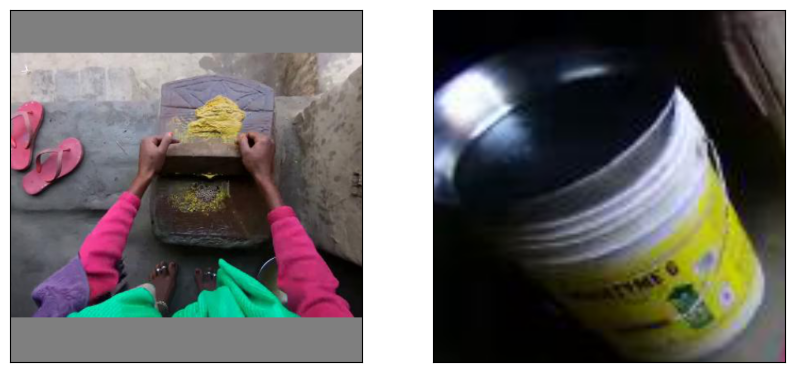

torch.Size([1, 32, 3, 448, 448])
torch.Size([1, 3, 448, 448])


mean IoU:      0.672
mean prob acc: 1.000
Gt range: [594, 597]



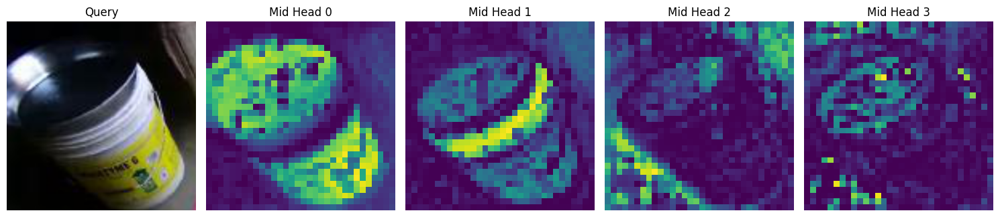

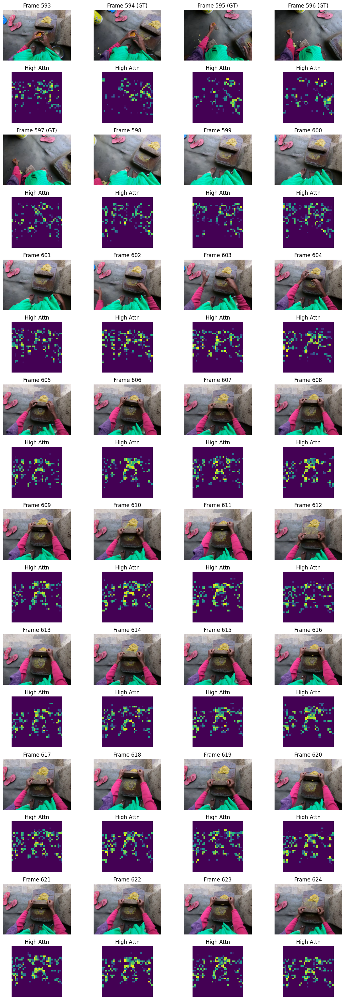


ramdom idx: 204

dict_keys(['segment', 'query', 'gt_bboxes', 'gt_probs', 'before_query_mask', 'reorder_idxs', 'video_uid', 'clip_uid', 'annotation_uid', 'seg_idxs', 'query_set', 'clip_fps', 'query_frame', 'visual_crop', 'object_title'])
tray


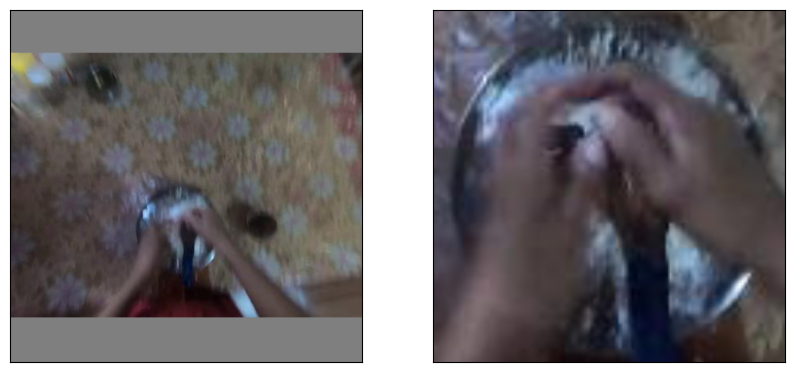

torch.Size([1, 32, 3, 448, 448])
torch.Size([1, 3, 448, 448])


mean IoU:      0.896
mean prob acc: 1.000
Gt range: [13, 53]



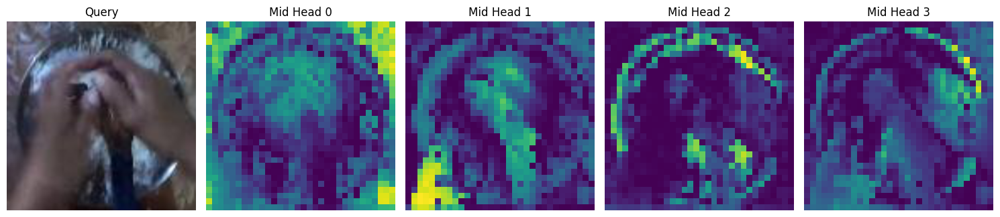

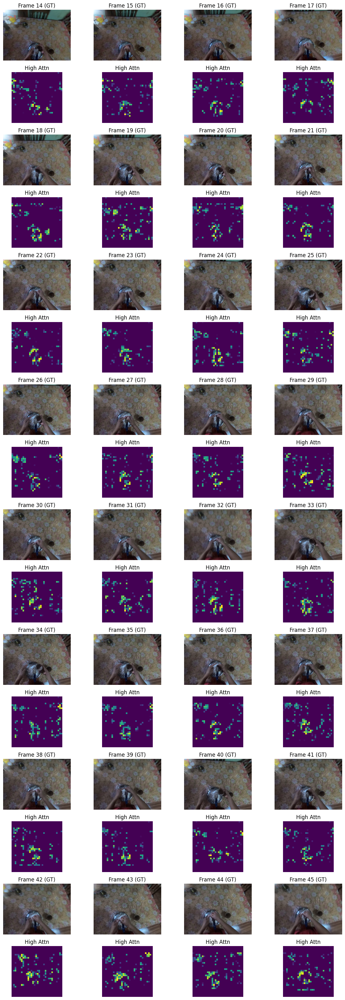


ramdom idx: 375

dict_keys(['segment', 'query', 'gt_bboxes', 'gt_probs', 'before_query_mask', 'reorder_idxs', 'video_uid', 'clip_uid', 'annotation_uid', 'seg_idxs', 'query_set', 'clip_fps', 'query_frame', 'visual_crop', 'object_title'])
electric kettle


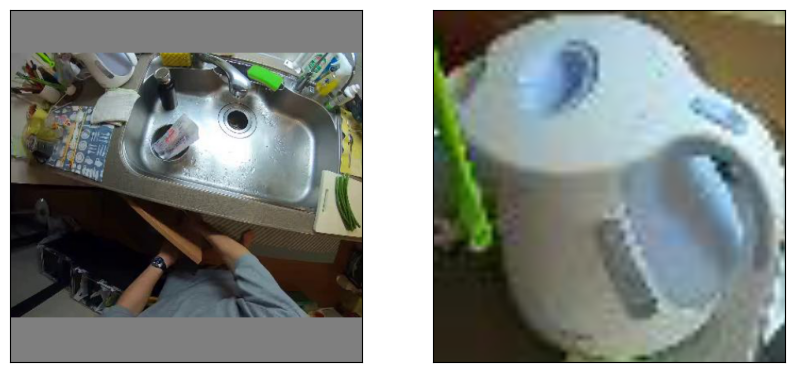

torch.Size([1, 32, 3, 448, 448])
torch.Size([1, 3, 448, 448])


mean IoU:      0.784
mean prob acc: 0.656
Gt range: [753, 783]



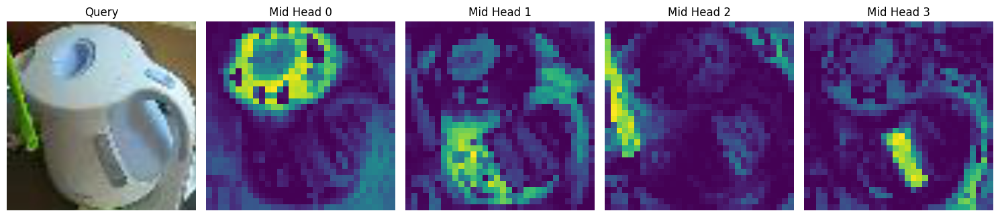

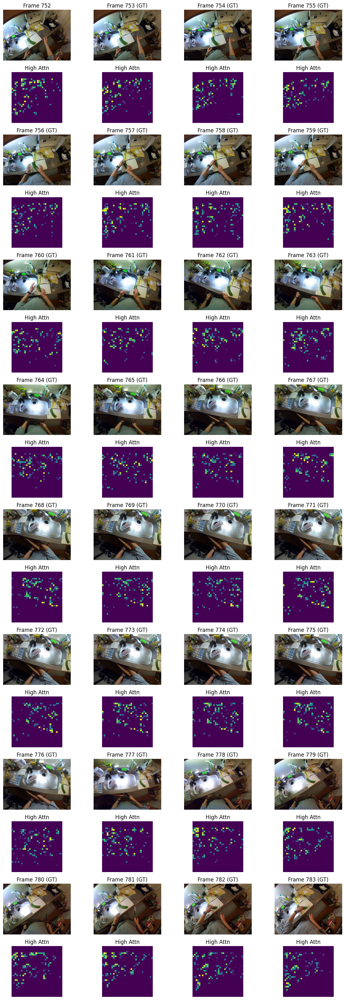


ramdom idx: 3286

dict_keys(['segment', 'query', 'gt_bboxes', 'gt_probs', 'before_query_mask', 'reorder_idxs', 'video_uid', 'clip_uid', 'annotation_uid', 'seg_idxs', 'query_set', 'clip_fps', 'query_frame', 'visual_crop', 'object_title'])
broom


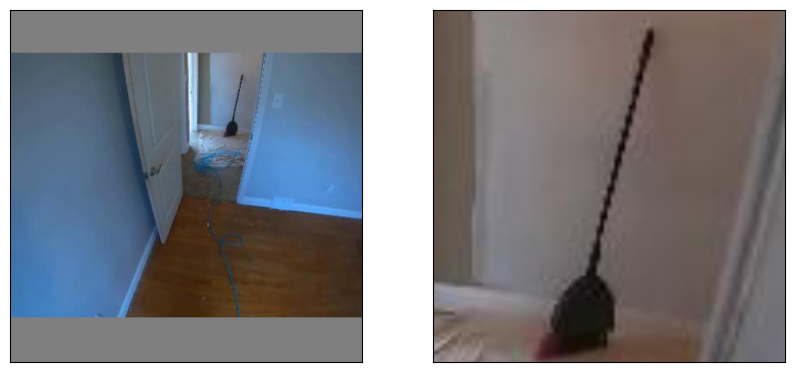

torch.Size([1, 32, 3, 448, 448])
torch.Size([1, 3, 448, 448])


mean IoU:      0.788
mean prob acc: 0.969
Gt range: [514, 532]



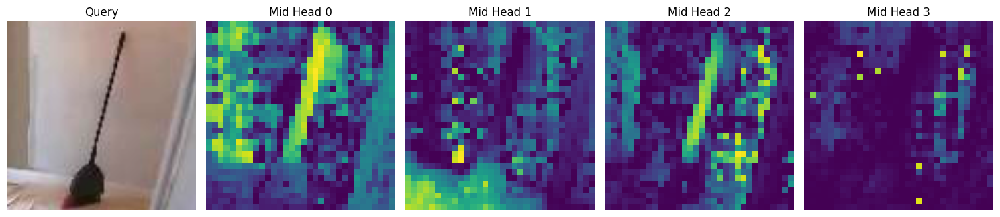

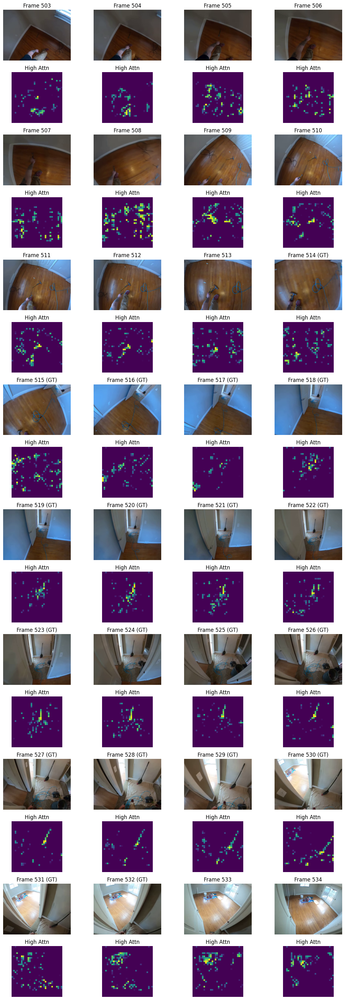

In [19]:
# get
# bidx = 2
# bidx = 300  # mean iou: 0 vs. 0.450
# bidx = 1307  # mean iou:
# bidx = 2300  # 슬리퍼
# bidx = 2305  # 물병
# bidx = 2333  # 상자
# bidx = 2334  # 화분  MAG 론 적절 , 너무 작음
# bidx = 4001  # 주걱: 화면 전환 빠름
# bidx = 4013  # 화분: 화면 전환 빠름
# bidx = 3900  # 예초기: baseline iou 0.197
# bidx = 3906  # 메탈프레임: baseline prob 0.56
# bidx = 3915
bidx = 236  # 잘 나오는 화분
# bidx = 824  # 전화기

import random

# 중간 노션 정리
# 204 # mag,hag 좋음 , 손이 들어가서 별로긴 한데 hag가 너무 잘보임
# 1143 # mag 굳, hag 별로
# 1905 # mag 애매, hag 굳
# 1805 # mag 애미, hag 굳
# 3679 # mag 굳, hag 별로
# 2278 # query 매우 별로
# 2962 # amg 굳 너무 작음
# 1575 # 믛 애매, hag 굳
# 569 # mag 굳, hag 애매하지막 나쁘지 않음
# 375 # mag 굳, hag 애매 사물 너무 많음
# 1332 # mag 굳, hag 굳
# 3286 # mag 낮은굳, hag 굳
# 4174 잘 하면 될 듯
# 1575 체리픽 하면 될 듯 - 애매하긴함


# random.seed(42)
# sample_indices = random.sample(range(0, 4504), 5)
# print(sample_indices)
# sample_indices = [bidx]
# sample_indices = [204,1905,1143,1575,1805,569,375,1332,3286,3679,2278,2962]


# 최종 노션 정리
sample_indices = [569,204,375,3286]
# 204 확정
# 375 좋은 듯?
# 569 occlusion 인데 일부 보일떄 확실히 밝은 값이 나옴 -> 가공해보자
# 3286 확정


for bidx in sample_indices:
    print('=' * 80)
    print()
    print(f"ramdom idx: {bidx}")
    print()
    print('=' * 80)

    batch = pdm.get_val_sample(idx=bidx)
    for k, v in batch.items():
        if isinstance(v, torch.Tensor):
            batch[k] = v.cuda()

    # viz
    print(batch.keys())
    print(batch['object_title'][0])
    # display(ten2pil(batch['segment'][0][len(batch['segment'][0]) // 2]))
    # display(ten2pil(batch['query'][0]))

    seg = rearrange(batch['segment'][0], 't c h w -> t h w c').cpu().numpy()
    q = rearrange(batch['query'][0], 'c h w -> h w c').cpu().numpy()
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    ax = axes[0]
    ax.imshow(seg[len(seg) // 2])
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    ax = axes[1]
    ax.imshow(q)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    plt.show()



    import decord

    p_clips_dir = Path('/data/dataset/ego4d_temp/ego4d_data/v2/vq2d_clips')
    p_clip = p_clips_dir / f'{batch["clip_uid"][0]}.mp4'
    vr = decord.VideoReader(str(p_clip))
    seg_idxs = batch['seg_idxs'][0]
    # Image.fromarray(vr[seg_idxs[0].item()].numpy()) , vr[seg_idxs[0].item()].numpy().shape

    qset_uuid = f"{batch['annotation_uid'][0]}_{batch['query_set'][0]}"
    gt_range = quid2ann[qset_uuid]['response_track_valid_range']
    
    out1 = None
    out2 = None
    with torch.inference_mode():
        inputs = dict(**batch)
        inputs['segment'], inputs['query'] = pdm.normalize(inputs['segment'], inputs['query'])
        # inputs['query'] = inputs['query'].transpose(-1, -2)  # [B, C, H, W] -> [B, C, W, H]
        # out1 = plm_base.model.forward(**inputs, compute_loss=True, get_intermediate_features=True, training=False)
        out2 = plm.model.forward(**inputs, compute_loss=True, get_intermediate_features=True, training=False)
    output_dict = out2

    print(batch['segment'].shape)
    print(batch['query'].shape)
    print()
    print('=' * 80)
    print()
    print(f"mean IoU:      {out2['log_dict']['iou'].item():.3f}")
    print(f"mean prob acc: {out2['log_dict']['prob_acc'].item():.3f}")
    print(f'Gt range: {gt_range}')
    print()
    print('=' * 80)
    

    if False:
        # plot
        probs, probs_sm, peaks, plat_idxs, plat_thres = compute_final_preds(inter_preds2, qset_uuid)
        probs1, probs_sm1, peaks1, plat_idxs1, plat_thres1 = compute_final_preds(inter_preds1, qset_uuid)

        fig, ax = plt.subplots(figsize=(10, 5))
        plt.axvspan(gt_range[0], gt_range[1], color='g', alpha=0.2, label='GT interval')
        plt.plot(peaks, probs[peaks], "x", color='k', markersize=8, markeredgewidth=4, zorder=10)
        plt.plot(peaks1, probs1[peaks1], "x", color='k', label='peaks', markersize=8, markeredgewidth=4, zorder=10)

        pp = plt.plot(probs1, label='VQLoC score')
        color = pp[0].get_color()
        plt.plot(plat_idxs1, probs1[plat_idxs1], color=color, lw=6, label='VQLoC final pred')

        pp = plt.plot(probs, c=plt.get_cmap('tab20')(6), label='HERO-VQL score')
        color = pp[0].get_color()
        plt.plot(plat_idxs, probs[plat_idxs], color=color, lw=6, label='HERO-VQL final pred')

        plt.setp(plt.gca().get_xticklabels(), fontsize=18)
        plt.setp(plt.gca().get_yticklabels(), fontsize=18)
        plt.gca().legend(
            loc='upper center', bbox_to_anchor=(0.5, 1.2),
            ncol=3, fancybox=True, shadow=True, fontsize=14)
        plt.ylim(0, 1)
        plt.show()

    t, c, h, w = output_dict['feat']['clip']['backbone'].shape
    stx_tgt_mask = output_dict['feat']['guide']['stx_tgt_mask']
    stx_mem_mask = output_dict['feat']['guide']['stx_mem_mask']

    high_attn_guidence = rearrange(stx_tgt_mask, '(b t H) n1 (h w)  -> H n1 (b t) h w',b=1,t=t,H=4,h=h,w=w)[0,0,...]
    mid_attn_guidence = rearrange(stx_mem_mask, '(b t H) hw (h2 w2)  -> hw t b H h2 w2',b=1,t=t,H=4,h2=h,w2=w)[0,0,0,...]
    save_img   = True

    show_query_and_mid_guidence(batch['query'][0], mid_attn_guidence, save_img=save_img, bidx=bidx, save_dir=f'/data/joohyun7u/project/vq2d-lightning/notebooks/tag_vis_0.9ver/{bidx}',)
    show_video_and_high_guidence(
        vr, 
        seg_idxs, 
        high_attn_guidence, 
        gt_range=gt_range,
        save_img=save_img, bidx=bidx, save_dir=f'/data/joohyun7u/project/vq2d-lightning/notebooks/tag_vis_0.9ver/{bidx}',
        func=lambda img: np.clip(( (img - img.min()) / (img.max() - img.min()) - 0.9 ) * 2.0, 0, 1)
    )

In [ ]:
# [204,4467,1905,1143,1575,1805,569,375,1332,3286,3679,2278,2962]

import matplotlib.pyplot as plt
for i in [0.4,0.5,0.6,0.7,0.8,0.9,1.0]:
    img = high_attn_guidence[1].cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min())  # normalize to [0, 1]
    img = np.clip((img - i) * 2.0, 0, 1)  # increase contrast: shift and scale, then clip
    plt.imshow(img, cmap='viridis')
    # plt.title('high_attn_guidence[0]')
    plt.colorbar()
    plt.show()

In [ ]:
from scipy.signal import find_peaks, medfilt
from PIL import Image, ImageDraw

inter_preds2 = torch.load('/data/soyeon/vq2d/vq2d-lightning/outputs/predictions/88023/intermediate_predictions.pt', weights_only=True)
final_preds = json.load(open('/data/soyeon/vq2d/vq2d-lightning/outputs/predictions/88023/predictions.json'))
quid2pred2 = {}
for video_preds in final_preds['results']['videos']:
    for clip_preds in video_preds['clips']:
        for qset_preds in clip_preds['predictions']:
            annotation_uid = qset_preds['annotation_uid']
            for qset_id, preds in qset_preds['query_sets'].items():
                qset_uuid = f"{annotation_uid}_{qset_id}"
                quid2pred2[qset_uuid] = preds
print(len(quid2pred2))
quid2pred1 = quid2pred2
inter_preds1 = inter_preds2


quid_list = list(quid2pred1.keys())
bidx = 2006
# for idx, quid in enumerate(quid_list):
#     if 'e439a809-bfe1-444d-89d3-e68b19e3bc21_1' == quid:

#         break 


batch = pdm.get_val_sample(idx=bidx)
for k, v in batch.items():
    if isinstance(v, torch.Tensor):
        batch[k] = v.cuda()
        
print(f'{batch['annotation_uid'][0]}_{batch['query_set'][0]}')
print(batch['object_title'])

display(ten2pil(batch['segment'][0][len(batch['segment'][0]) // 2]))
display(ten2pil(batch['query'][0]))

qset_uuid = f"{batch['annotation_uid'][0]}_{batch['query_set'][0]}"
gt_range = quid2ann[qset_uuid]['response_track_valid_range']

def compute_final_preds(preds, qset_uuid):
    ret_scores = preds[qset_uuid]['ret_scores']
    probs = ret_scores.sigmoid().cpu().numpy()
    probs_sm = medfilt(probs, kernel_size=5)
    peaks, _ = find_peaks(probs_sm)
    max_peak_prob = probs_sm[peaks].max()
    valid_peak_thres = max_peak_prob * 0.8
    peaks = peaks[probs_sm[peaks] > valid_peak_thres]
    last_valid_peak = peaks[-1]
    plat_thres = 0.7 * probs_sm[last_valid_peak]
    plat_idxs = np.where(probs_sm > plat_thres)[0]
    disc_idxs = np.where(np.diff(plat_idxs) > 1)[0]
    for i_from, i_to in zip(disc_idxs[:-1], disc_idxs[1:]):
        plat_idxs_tmp = plat_idxs[i_from+1:i_to]
        if last_valid_peak in plat_idxs_tmp:
            plat_idxs = plat_idxs_tmp
            break
    else:
        plat_idxs = plat_idxs[disc_idxs[-1]+1:]
    assert last_valid_peak in plat_idxs
    return probs, probs_sm, peaks, plat_idxs, plat_thres

if True:
    # plot
    probs, probs_sm, peaks, plat_idxs, plat_thres = compute_final_preds(inter_preds2, qset_uuid)
    probs1, probs_sm1, peaks1, plat_idxs1, plat_thres1 = compute_final_preds(inter_preds1, qset_uuid)

    fig, ax = plt.subplots(figsize=(10, 5))
    plt.axvspan(gt_range[0], gt_range[1], color='g', alpha=0.2, label='GT interval')
    plt.plot(peaks, probs[peaks], "x", color='k', markersize=8, markeredgewidth=4, zorder=10)
    plt.plot(peaks1, probs1[peaks1], "x", color='k', label='peaks', markersize=8, markeredgewidth=4, zorder=10)

    pp = plt.plot(probs1, label='VQLoC score')
    color = pp[0].get_color()
    plt.plot(plat_idxs1, probs1[plat_idxs1], color=color, lw=6, label='VQLoC final pred')

    pp = plt.plot(probs, c=plt.get_cmap('tab20')(6), label='HERO-VQL score')
    color = pp[0].get_color()
    plt.plot(plat_idxs, probs[plat_idxs], color=color, lw=6, label='HERO-VQL final pred')

    plt.setp(plt.gca().get_xticklabels(), fontsize=18)
    plt.setp(plt.gca().get_yticklabels(), fontsize=18)
    plt.gca().legend(
        loc='upper center', bbox_to_anchor=(0.5, 1.2),
        ncol=3, fancybox=True, shadow=True, fontsize=14)
    plt.ylim(0, 1)
    plt.show()

oh, ow = quid2ann[qset_uuid]['original_height'], quid2ann[qset_uuid]['original_width']
clip_uid = quid2ann[qset_uuid]['clip_uid']

fnos_gt = [bbox['fno'] for bbox in quid2ann[qset_uuid]['response_track']]
fnos1 = [bbox['fno'] for bbox in quid2pred1[qset_uuid]['bboxes']]
fnos2 = [bbox['fno'] for bbox in quid2pred2[qset_uuid]['bboxes']]
images = []
seg_idx_start = batch['seg_idxs'][0].min().item()
seg_idxs = list(range(seg_idx_start - 8, seg_idx_start + 48))
for fidx, seg_idx in enumerate(seg_idxs):
    image = Image.open(f'/local_datasets/ego4d_data/v2/vq2d_frames/320ss/{clip_uid}/frame_{seg_idx+1:07d}.jpg').convert('RGBA')
    w, h = image.size
    draw = ImageDraw.Draw(image)

    if seg_idx in fnos1:
        bbox = quid2pred1[qset_uuid]['bboxes'][fnos1.index(seg_idx)]
        px1, py1, px2, py2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
        px1, py1, px2, py2 = map(int, [px1 * w / ow, py1 * h / oh, px2 * w / ow, py2 * h / oh])
        draw.rectangle([(px1, py1), (px2, py2)], outline=(32, 32, 255), width=4)

    if seg_idx in fnos2:
        bbox = quid2pred2[qset_uuid]['bboxes'][fnos2.index(seg_idx)]
        ppx1, ppy1, ppx2, ppy2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
        ppx1, ppy1, ppx2, ppy2 = map(int, [ppx1 * w / ow, ppy1 * h / oh, ppx2 * w / ow, ppy2 * h / oh])
        draw.rectangle([(ppx1, ppy1), (ppx2, ppy2)], outline=(255, 0, 0), width=4)

    if seg_idx in fnos_gt:
        bbox = quid2ann[qset_uuid]['response_track'][fnos_gt.index(seg_idx)]
        gx1, gy1, gx2, gy2 = bbox['x'], bbox['y'], bbox['x'] + bbox['w'], bbox['y'] + bbox['h']
        gx1, gy1, gx2, gy2 = map(int, [gx1 * w / ow, gy1 * h / oh, gx2 * w / ow, gy2 * h / oh])
        draw.rectangle([(gx1, gy1), (gx2, gy2)], outline=(0, 255, 0), width=4)

    if fidx < 32:
        display(image)
    images.append(image)